In [2]:
using DataFrames
using Gadfly
using Compose
set_default_plot_size(30cm, 12cm)

# 1HVR_apo

## minimization

In [29]:
dir_1hvr_apo_min="/home/german/labo/16/exs/run/1hvr_apo/mhe/m"
hvr_apo_min_Etot = readdlm("$dir_1hvr_apo_min/outputs/Etot_min");
hvr_apo_mmin_Etot = readdlm("$dir_1hvr_apo_min/outputs/Etot_mmin");
df_1hvr_apo_MIN_Etot = DataFrame(E=[hvr_apo_min_Etot[:, 2]; hvr_apo_mmin_Etot[:, 2]],
NSTEP=[hvr_apo_min_Etot[:, 1]; hvr_apo_mmin_Etot[:, 1]]);

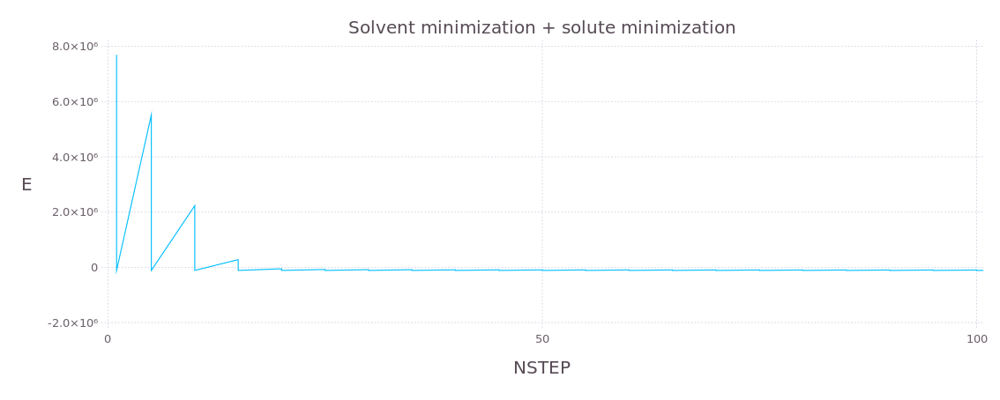

In [30]:
plot(df_1hvr_apo_MIN_Etot, Geom.line, x="NSTEP", y="E",
Coord.Cartesian(xmin=0, xmax=100),
Guide.title("Solvent minimization + solute minimization"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt, key_title_font_size = 30pt))

## heat

In [31]:
# Energies
dir_1hvr_apo_hea="/home/german/labo/16/exs/run/1hvr_apo/mhe/h"
hvr_apo_hea_Ek = readdlm("$dir_1hvr_apo_hea/outputs/ektot.dat");
hvr_apo_hea_Ep = readdlm("$dir_1hvr_apo_hea/outputs/eptot.dat");
hvr_apo_hea_Etot = readdlm("$dir_1hvr_apo_hea/outputs/etot.dat");

df_1hvr_apo_HEA_E = DataFrame(E=[hvr_apo_hea_Ek[:, 2]; hvr_apo_hea_Ep[:, 2]; hvr_apo_hea_Etot[:, 2]],
NSTEP=[hvr_apo_hea_Ek[:, 1]; hvr_apo_hea_Ep[:, 1]; hvr_apo_hea_Etot[:, 1]];
Type=repeat(["Ek"; "Ep"; "Etot"], inner=[length(hvr_apo_hea_Ek[:, 1])]));

# Temperature
hvr_apo_hea_T = readdlm("$dir_1hvr_apo_hea/outputs/temp.dat");
df_1hvr_apo_HEA_T = DataFrame(Temperature=hvr_apo_hea_T[:, 2],
NSTEP=hvr_apo_hea_T[:, 1]);

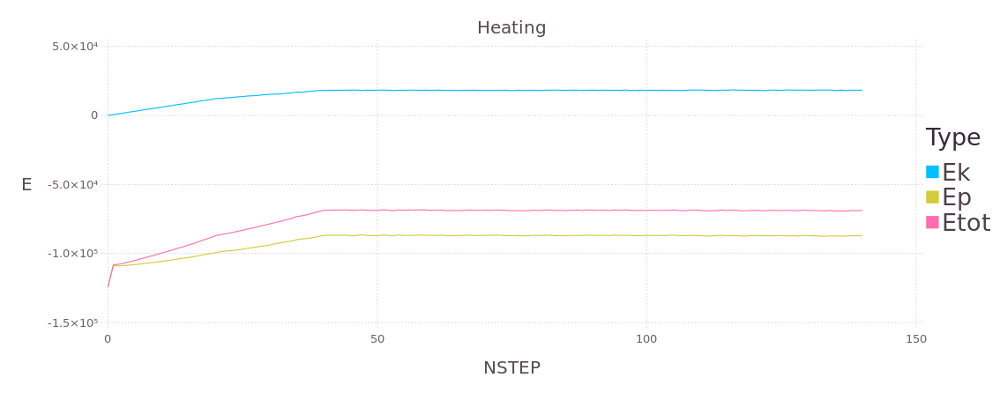

In [32]:
plot(df_1hvr_apo_HEA_E, Geom.line, x="NSTEP", y="E", color="Type",
Guide.title("Heating"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

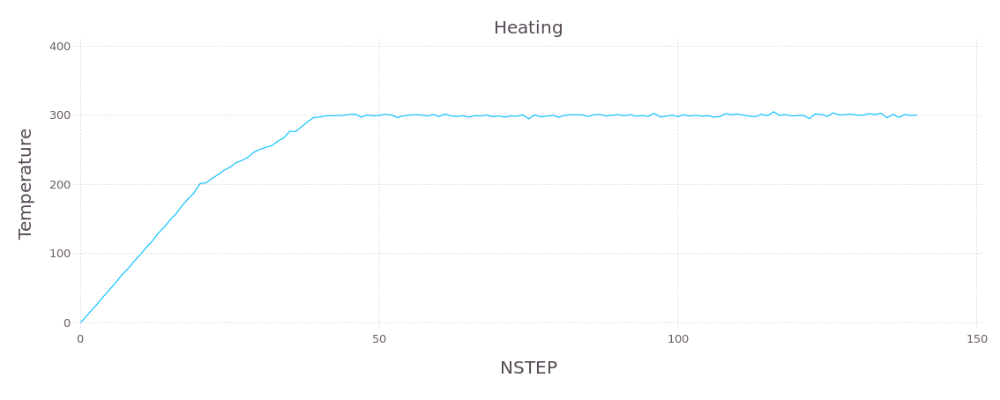

In [33]:
plot(df_1hvr_apo_HEA_T, Geom.line, x="NSTEP", y="Temperature",
Guide.title("Heating"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

## equilibration

In [36]:
# Energies
dir_1hvr_apo_equ="/home/german/labo/16/exs/run/1hvr_apo/mhe/e"
hvr_apo_equ_Ek = readdlm("$dir_1hvr_apo_equ/outputs/ektot.dat");
hvr_apo_equ_Ep = readdlm("$dir_1hvr_apo_equ/outputs/eptot.dat");
hvr_apo_equ_Etot = readdlm("$dir_1hvr_apo_equ/outputs/etot.dat");

df_1hvr_apo_EQU_E = DataFrame(E=[hvr_apo_equ_Ek[:, 2]; hvr_apo_equ_Ep[:, 2]; hvr_apo_equ_Etot[:, 2]],
NSTEP=[hvr_apo_equ_Ek[:, 1]; hvr_apo_equ_Ep[:, 1]; hvr_apo_equ_Etot[:, 1]];
Type=repeat(["Ek"; "Ep"; "Etot"], inner=[length(hvr_apo_equ_Ek[:, 1])]));

# Temperature
hvr_apo_equ_T = readdlm("$dir_1hvr_apo_equ/outputs/temp.dat");
df_1hvr_apo_EQU_T = DataFrame(Temperature=hvr_apo_equ_T[:, 2],
NSTEP=hvr_apo_equ_T[:, 1]);

# RMSD ntwx=500
hvr_apo_equ_rmsd = readdlm("$dir_1hvr_apo_equ/rmsd_equ_1hvr_apo");
df_1hvr_apo_EQU_RMSD = DataFrame(RMSD=hvr_apo_equ_rmsd[:, 2], Frame=hvr_apo_equ_rmsd[:, 1]);

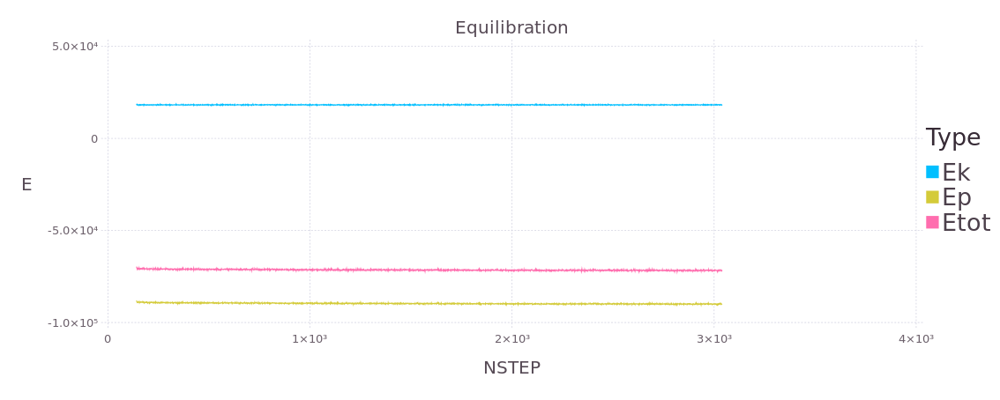

In [37]:
plot(df_1hvr_apo_EQU_E, Geom.line, x="NSTEP", y="E", color="Type",
Guide.title("Equilibration"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

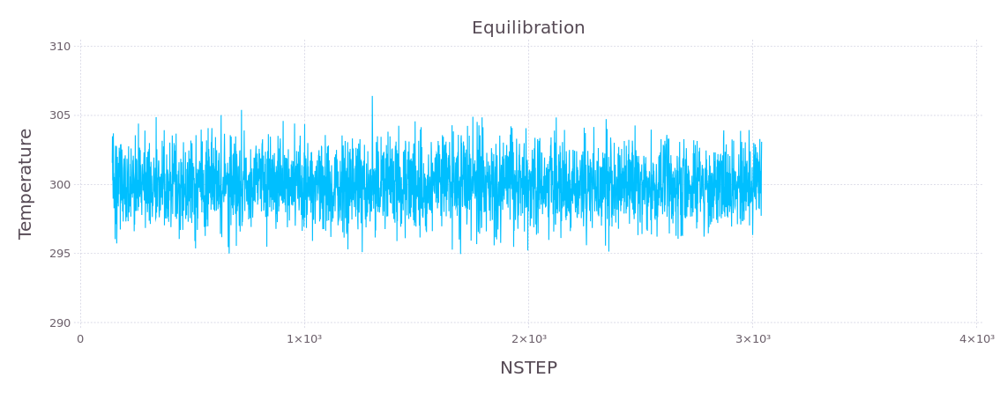

In [38]:
plot(df_1hvr_apo_EQU_T, Geom.line, x="NSTEP", y="Temperature",
Guide.title("Equilibration"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

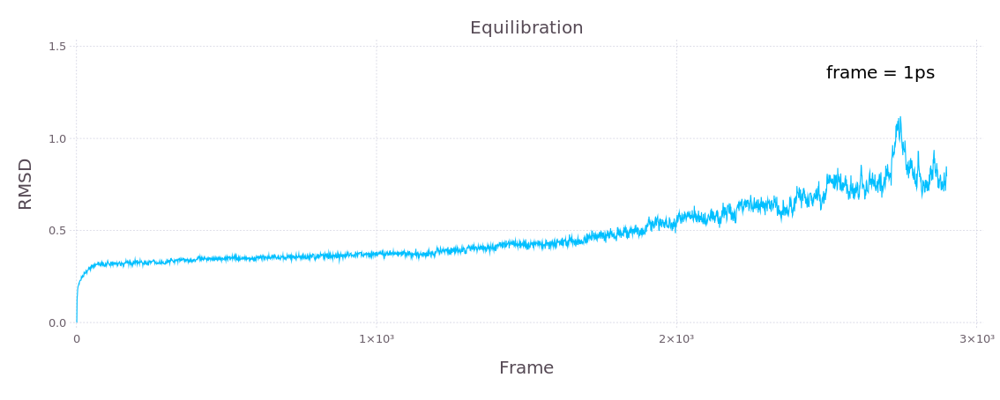

In [39]:
# Los últimos pasos fueron escritos c/ 10ps y no c/ 1 ps
plot(df_1hvr_apo_EQU_RMSD, Geom.line, x="Frame", y="RMSD",
Guide.title("Equilibration"),
Guide.annotation(compose(compose(context(), text(2500, 1.3, "frame = 1ps")), fontsize(15pt), fill("black"))),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

### production

In [40]:
# Energies
dir_1hvr_apo_pdt = "/home/german/labo/16/exs/run/1hvr_apo"
hvr_apo_pdt_Ek = readdlm("$dir_1hvr_apo_pdt/outputs/ektot.dat");
hvr_apo_pdt_Ep = readdlm("$dir_1hvr_apo_pdt/outputs/eptot.dat");
hvr_apo_pdt_Etot = readdlm("$dir_1hvr_apo_pdt/outputs/etot.dat");
df_1hvr_apo_PDT_E = DataFrame(E=[hvr_apo_pdt_Ek[:, 2]; hvr_apo_pdt_Ep[:, 2]; hvr_apo_pdt_Etot[:, 2]],
NSTEP=[hvr_apo_pdt_Ek[:, 1]; hvr_apo_pdt_Ep[:, 1]; hvr_apo_pdt_Etot[:, 1]];
Type=repeat(["Ek"; "Ep"; "Etot"], inner=[length(hvr_apo_pdt_Ek[:, 1])]));

# Temperature
hvr_apo_pdt_T = readdlm("$dir_1hvr_apo_pdt/outputs/temp.dat");
df_1hvr_apo_PDT_T = DataFrame(Temperature=hvr_apo_pdt_T[:, 2],
NSTEP=hvr_apo_pdt_T[:, 1]);

# RMSD 
hvr_apo_pdt_rmsd = readdlm("$dir_1hvr_apo_pdt/data/rmsd_1hvr_apo");
df_1hvr_apo_PDT_RMSD = DataFrame(RMSD=hvr_apo_pdt_rmsd[:, 2], Frame=hvr_apo_pdt_rmsd[:, 1]);

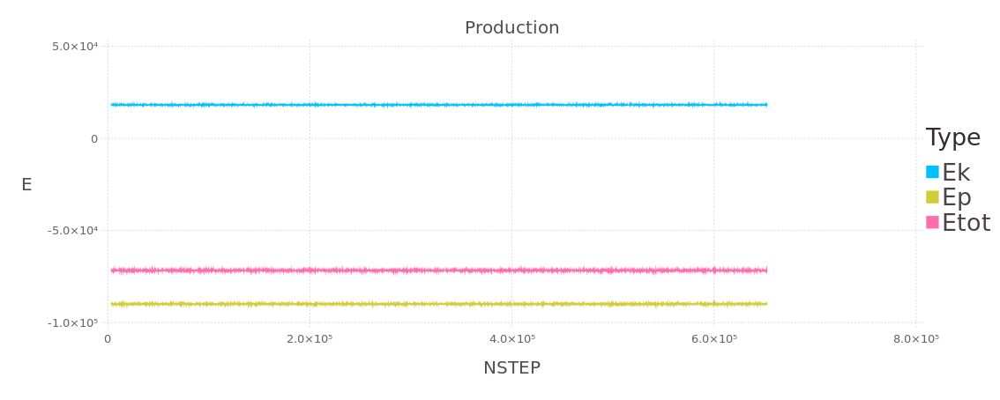

In [41]:
plot(df_1hvr_apo_PDT_E, Geom.line, x="NSTEP", y="E", color="Type",
Guide.title("Production"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))                                                        

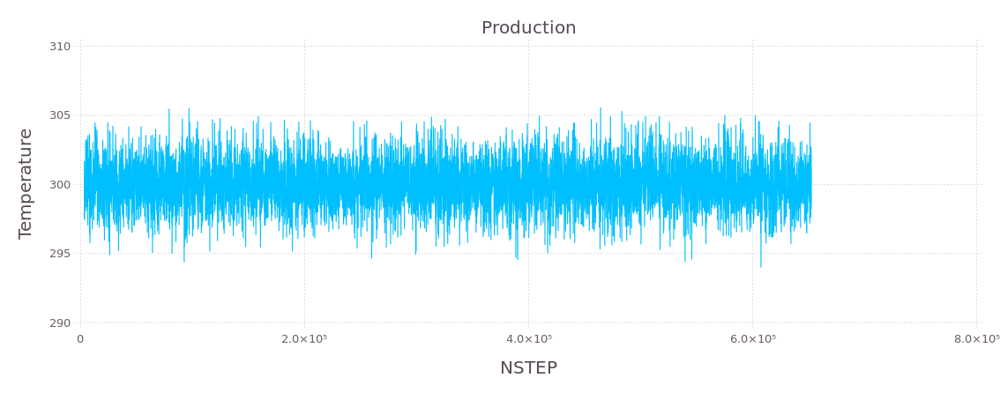

In [42]:
plot(df_1hvr_apo_PDT_T, Geom.line, x="NSTEP", y="Temperature",
Guide.title("Production"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

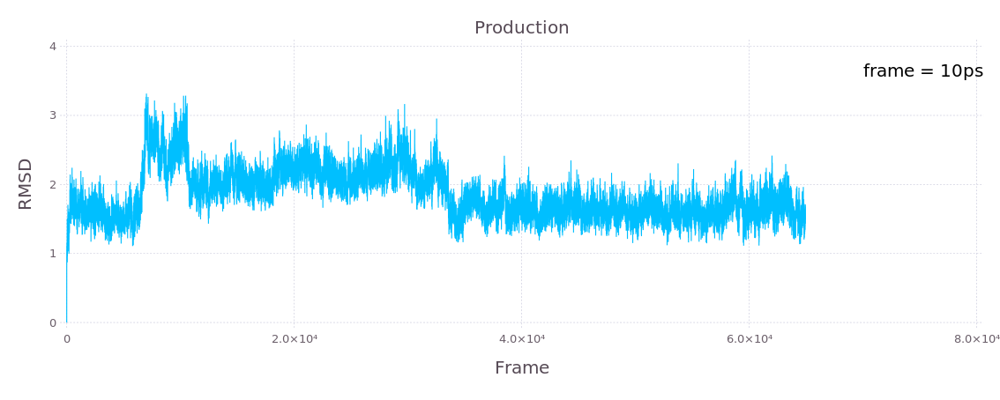

In [43]:
plot(df_1hvr_apo_PDT_RMSD, Geom.line, x="Frame", y="RMSD",
Guide.title("Production"),
Guide.annotation(compose(compose(context(), text(70000, 3.5, "frame = 10ps")), fontsize(15pt), fill("black"))),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

# 1HVR_hol

## minimization

In [16]:
dir_hvr_hol_min="/home/german/labo/16/exs/run/1hvr_hol/mhe/m"
hvr_hol_min_Etot = readdlm("$dir_hvr_hol_min/outputs/Etot_min");
hvr_hol_mmin_Etot = readdlm("$dir_hvr_hol_min/outputs/Etot_mmin");
df_hvr_hol_MIN_Etot = DataFrame(E=[hvr_hol_min_Etot[:, 2]; hvr_hol_mmin_Etot[:, 2]],
NSTEP=[hvr_hol_min_Etot[:, 1]; hvr_hol_mmin_Etot[:, 1]]);

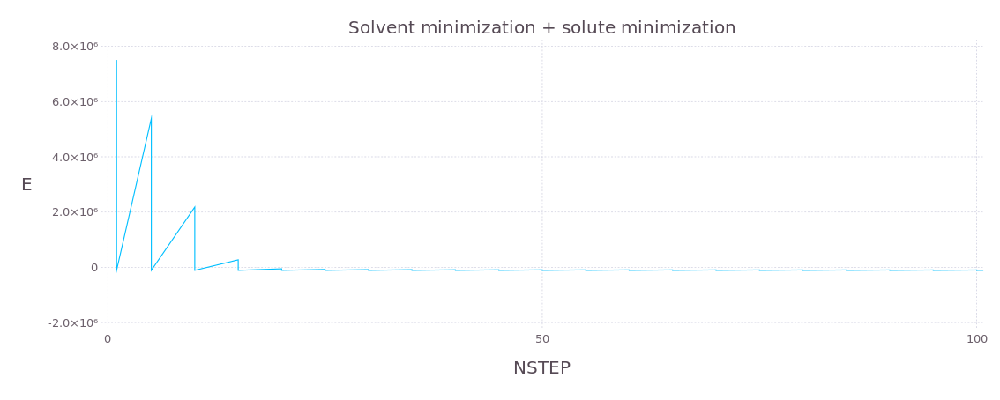

In [17]:
plot(df_hvr_hol_MIN_Etot, Geom.line, x="NSTEP", y="E",
Coord.Cartesian(xmin=0, xmax=100),
Guide.title("Solvent minimization + solute minimization"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt, key_title_font_size = 30pt))

## heat

In [18]:
# Energies
dir_hvr_hol_hea="/home/german/labo/16/exs/run/1hvr_hol/mhe/h"
hvr_hol_hea_Ek = readdlm("$dir_hvr_hol_hea/outputs/ektot.dat");
hvr_hol_hea_Ep = readdlm("$dir_hvr_hol_hea/outputs/eptot.dat");
hvr_hol_hea_Etot = readdlm("$dir_hvr_hol_hea/outputs/etot.dat");
df_hvr_hol_HEA_E = DataFrame(E=[hvr_hol_hea_Ek[:, 2]; hvr_hol_hea_Ep[:, 2]; hvr_hol_hea_Etot[:, 2]],
NSTEP=[hvr_hol_hea_Ek[:, 1]; hvr_hol_hea_Ep[:, 1]; hvr_hol_hea_Etot[:, 1]];
Type=repeat(["Ek"; "Ep"; "Etot"], inner=[length(hvr_hol_hea_Ek[:, 1])]));

# Temperature
hvr_hol_hea_T = readdlm("$dir_hvr_hol_hea/outputs/temp.dat");
df_hvr_hol_HEA_T = DataFrame(Temperature=hvr_hol_hea_T[:, 2],
NSTEP=hvr_hol_hea_T[:, 1]);

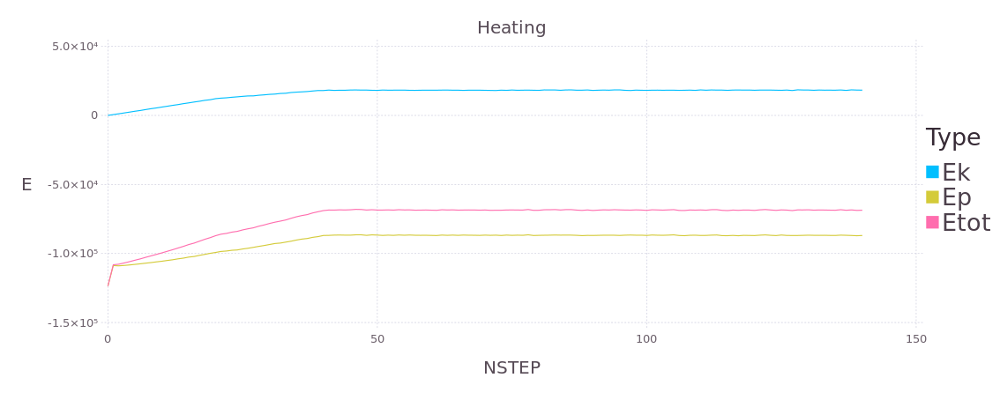

In [19]:
plot(df_hvr_hol_HEA_E, Geom.line, x="NSTEP", y="E", color="Type",
Guide.title("Heating"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

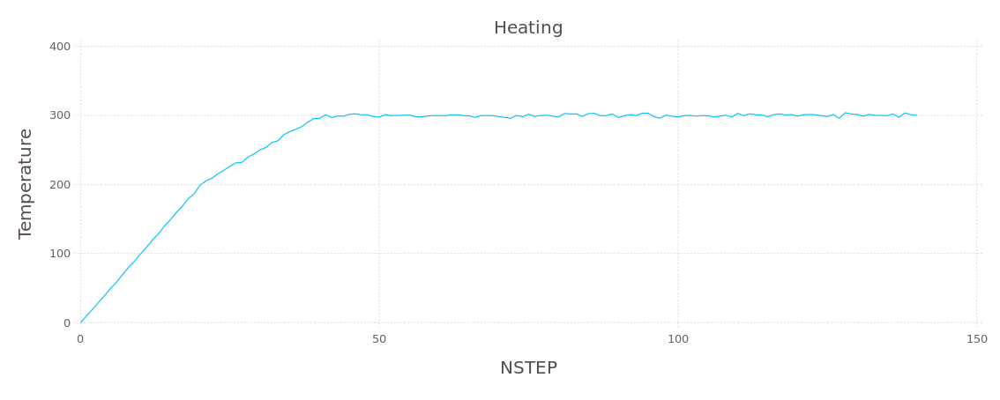

In [20]:
plot(df_hvr_hol_HEA_T, Geom.line, x="NSTEP", y="Temperature",
Guide.title("Heating"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

## equilibration

In [21]:
# Energies
dir_hvr_hol_equ="/home/german/labo/16/exs/run/1hvr_hol/mhe/e"
hvr_hol_equ_Ek = readdlm("$dir_hvr_hol_equ/outputs/ektot.dat");
hvr_hol_equ_Ep = readdlm("$dir_hvr_hol_equ/outputs/eptot.dat");
hvr_hol_equ_Etot = readdlm("$dir_hvr_hol_equ/outputs/etot.dat");
df_hvr_hol_EQU_E = DataFrame(E=[hvr_hol_equ_Ek[:, 2]; hvr_hol_equ_Ep[:, 2]; hvr_hol_equ_Etot[:, 2]],
NSTEP=[hvr_hol_equ_Ek[:, 1]; hvr_hol_equ_Ep[:, 1]; hvr_hol_equ_Etot[:, 1]];
Type=repeat(["Ek"; "Ep"; "Etot"], inner=[length(hvr_hol_equ_Ek[:, 1])]));

# Temperature
hvr_hol_equ_T = readdlm("$dir_hvr_hol_equ/outputs/temp.dat");
df_hvr_hol_EQU_T = DataFrame(Temperature=hvr_hol_equ_T[:, 2],
NSTEP=hvr_hol_equ_T[:, 1]);

# RMSD 
hvr_hol_equ_rmsd = readdlm("$dir_hvr_hol_equ/rmsd_equ_1hvr_hol");
df_hvr_hol_EQU_RMSD = DataFrame(RMSD=hvr_hol_equ_rmsd[:, 2], Frame=hvr_hol_equ_rmsd[:, 1]);

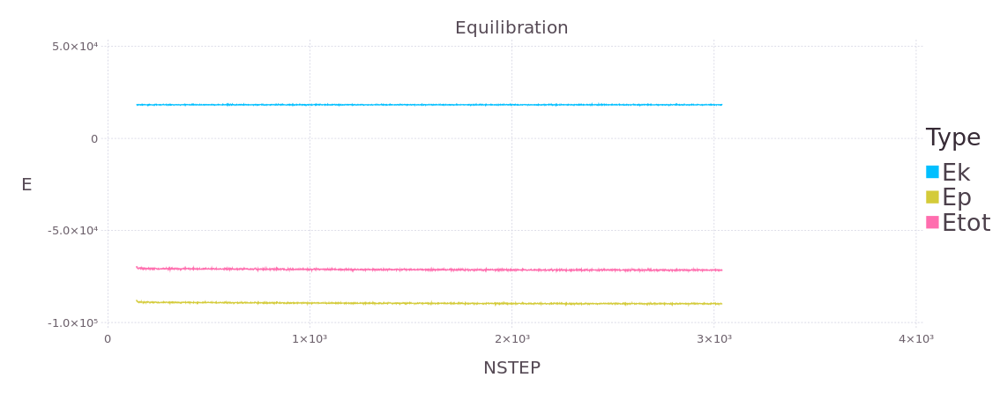

In [22]:
plot(df_hvr_hol_EQU_E, Geom.line, x="NSTEP", y="E", color="Type",
Guide.title("Equilibration"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

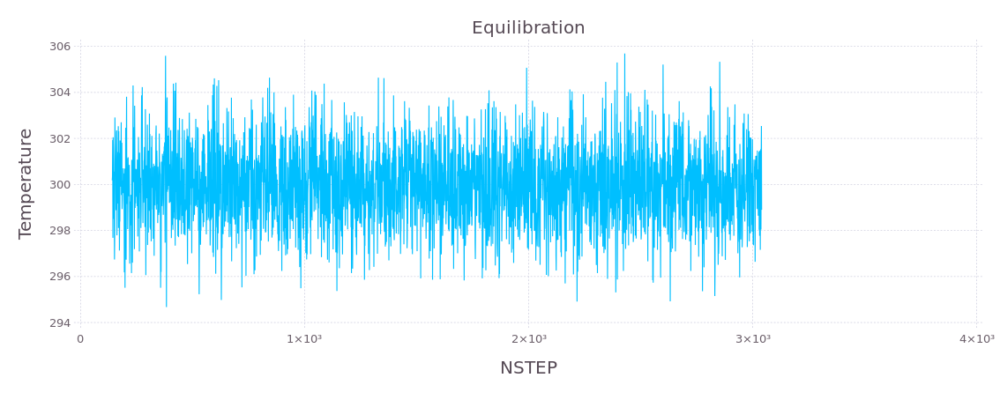

In [23]:
plot(df_hvr_hol_EQU_T, Geom.line, x="NSTEP", y="Temperature",
Guide.title("Equilibration"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

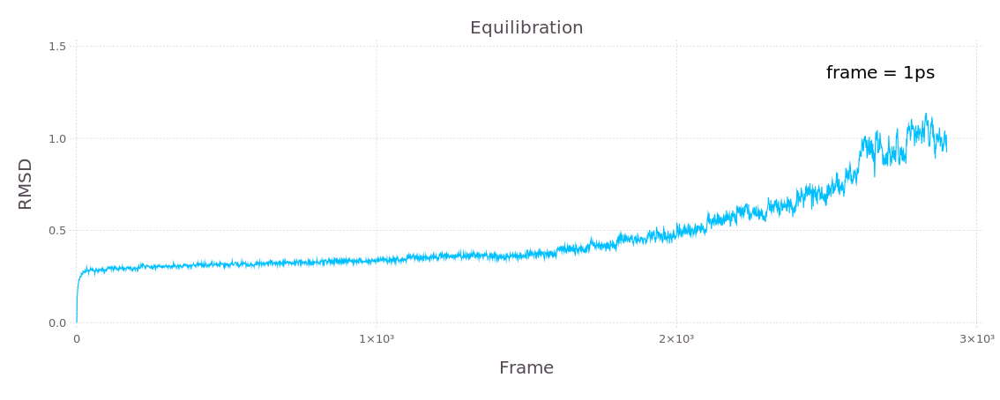

In [24]:
# Los últimos pasos fueron escritos c/ 10ps y no c/ 1 ps
plot(df_hvr_hol_EQU_RMSD, Geom.line, x="Frame", y="RMSD",
Guide.title("Equilibration"),
Guide.annotation(compose(compose(context(), text(2500, 1.3, "frame = 1ps")), fontsize(15pt), fill("black"))),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

### production

In [25]:
# Energies
dir_hvr_hol_pdt = "/home/german/labo/16/exs/run/1hvr_hol"
hvr_hol_pdt_Ek = readdlm("$dir_hvr_hol_pdt/outputs/ektot.dat");
hvr_hol_pdt_Ep = readdlm("$dir_hvr_hol_pdt/outputs/eptot.dat");
hvr_hol_pdt_Etot = readdlm("$dir_hvr_hol_pdt/outputs/etot.dat");
df_hvr_hol_PDT_E = DataFrame(E=[hvr_hol_pdt_Ek[:, 2]; hvr_hol_pdt_Ep[:, 2]; hvr_hol_pdt_Etot[:, 2]],
NSTEP=[hvr_hol_pdt_Ek[:, 1]; hvr_hol_pdt_Ep[:, 1]; hvr_hol_pdt_Etot[:, 1]];
Type=repeat(["Ek"; "Ep"; "Etot"], inner=[length(hvr_hol_pdt_Ek[:, 1])]));

# Temperature
hvr_hol_pdt_T = readdlm("$dir_hvr_hol_pdt/outputs/temp.dat");
df_hvr_hol_PDT_T = DataFrame(Temperature=hvr_hol_pdt_T[:, 2],
NSTEP=hvr_hol_pdt_T[:, 1]);

# RMSD 
hvr_hol_pdt_rmsd = readdlm("$dir_hvr_hol_pdt/data/rmsd_1hvr_hol");
df_hvr_hol_PDT_RMSD = DataFrame(RMSD=hvr_hol_pdt_rmsd[:, 2], Frame=hvr_hol_pdt_rmsd[:, 1]);

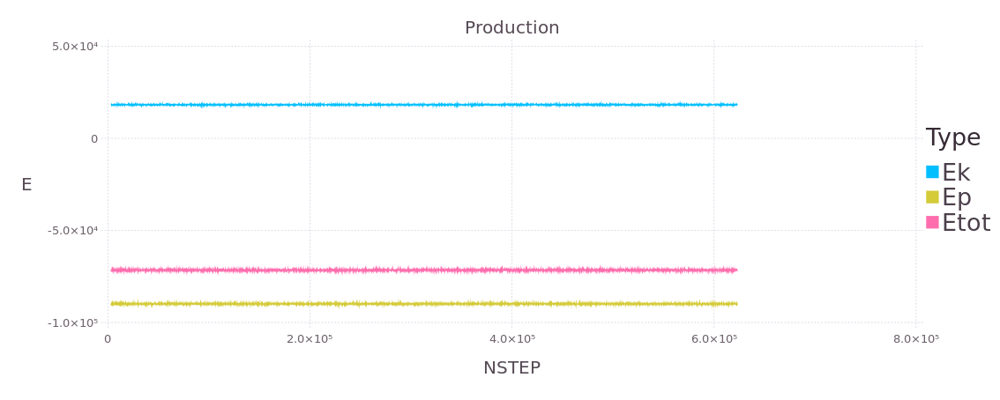

In [26]:
plot(df_hvr_hol_PDT_E, Geom.line, x="NSTEP", y="E", color="Type",
Guide.title("Production"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))                                                        

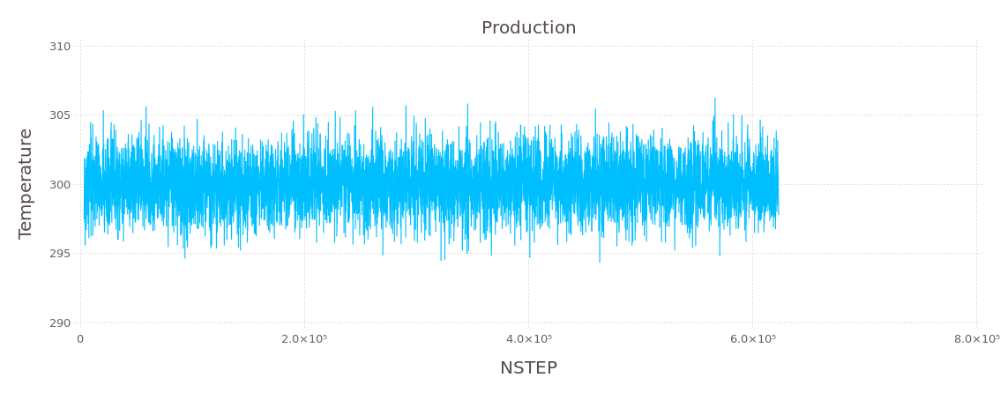

In [27]:
plot(df_hvr_hol_PDT_T, Geom.line, x="NSTEP", y="Temperature",
Guide.title("Production"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

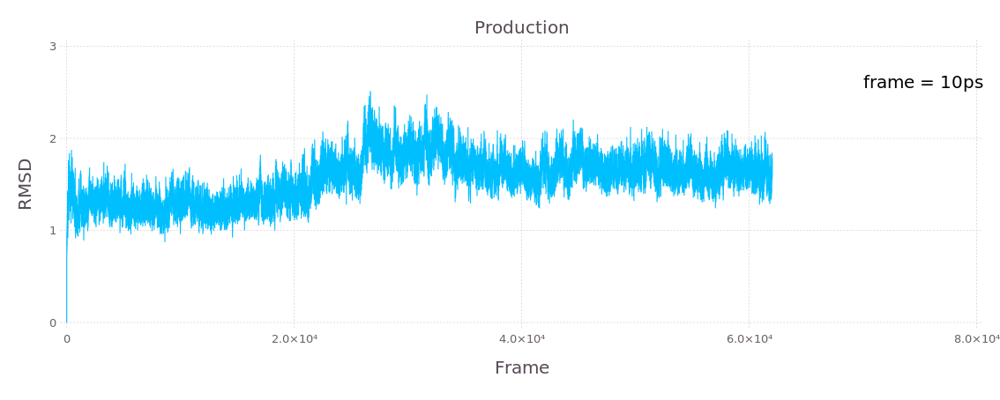

In [28]:
plot(df_hvr_hol_PDT_RMSD, Geom.line, x="Frame", y="RMSD",
Guide.title("Production"),
Guide.annotation(compose(compose(context(), text(70000, 2.5, "frame = 10ps")), fontsize(15pt), fill("black"))),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))